# STOCK PRICE PREDICTION USING RIDGE REGRESSION AND LSTM

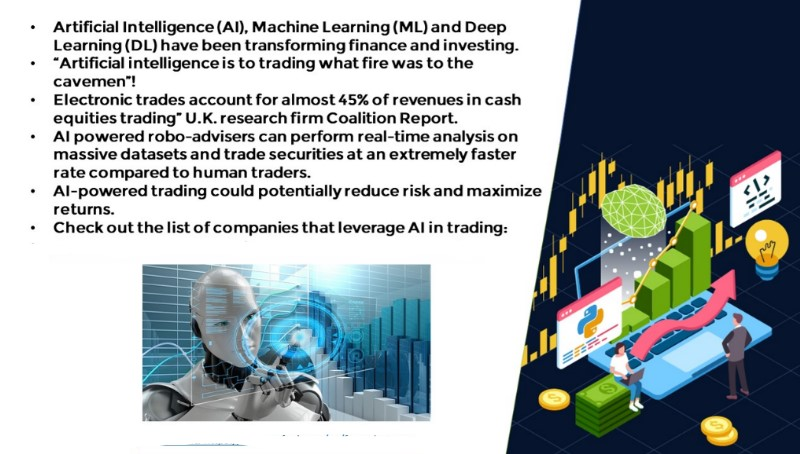

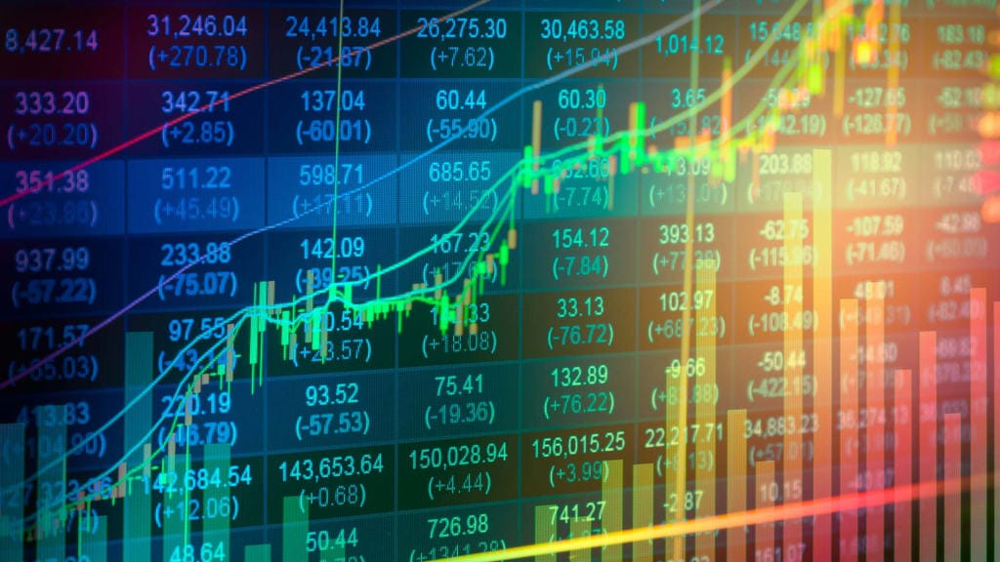

# Import Datasets


In [1]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow import keras
     

E:\anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [80]:
stock_price_df = pd.read_csv('stock_price.csv')

In [81]:
stock_price_df

,Unnamed: 0,Date,Natural_Gas,Crude_oil,Copper,Bitcoin,Platinum,Ethereum,sp500,Nasdaq100,...,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
0,0,2/2/2024,2.079,72.28,3.8215,"43,194.70",901.6,"2,309.28","4,958.61","17,642.73",...,187.91,411.22,22.796,142.38,661.60,"5,89,498",564.64,171.81,474.99,"2,053.70"
1,1,1/2/2024,2.050,73.82,3.8535,"43,081.40",922.3,"2,304.28","4,906.19","17,344.71",...,188.86,403.78,23.236,141.16,630.27,"5,81,600",567.51,159.28,394.78,"2,071.10"
2,2,31-01-2024,2.100,75.85,3.9060,"42,580.50",932.6,"2,283.14","4,848.87","17,137.24",...,187.29,397.58,23.169,140.10,615.27,"5,78,020",564.11,155.20,390.14,"2,067.40"
3,3,30-01-2024,2.077,77.82,3.9110,"42,946.20",931.7,"2,343.11","4,924.97","17,476.71",...,191.59,408.59,23.225,151.46,627.74,"5,84,680",562.85,159.00,400.06,"2,050.90"
4,4,29-01-2024,2.490,76.78,3.8790,"43,299.80",938.3,"2,317.79","4,927.93","17,596.27",...,190.93,409.72,23.134,153.51,624.65,"5,78,800",575.79,161.26,401.02,"2,034.90"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1008,1008,8/1/2020,2.141,59.61,2.8120,"8,059.60",961,140.81,"3,253.05","8,912.37",...,32.81,160.09,18.167,70.25,60.09,"3,39,188",339.26,94.60,215.22,"1,560.20"
1009,1009,7/1/2020,2.162,62.70,2.7935,"8,155.70",977.75,143.04,"3,237.18","8,846.45",...,31.27,157.58,18.393,69.76,59.98,"3,38,901",330.75,95.34,213.06,"1,574.30"
1010,1010,6/1/2020,2.135,63.27,2.7900,"7,759.10",969.35,144.08,"3,246.28","8,848.51",...,30.10,159.03,18.179,69.89,59.27,"3,40,210",335.83,95.14,212.60,"1,568.80"
1011,1011,3/1/2020,2.130,63.05,2.7870,"7,343.10",988.55,134.27,"3,234.85","8,793.90",...,29.53,158.62,18.151,68.08,59.02,"3,39,155",325.90,93.75,208.67,"1,552.40"


In [82]:
stock_price_df = stock_price_df.drop(stock_price_df.columns[0], axis=1)

In [83]:
for column in stock_price_df.columns[2:]:
    # Replace commas with empty string and convert to float
    stock_price_df[column] = stock_price_df[column].astype(str).str.replace(',', '').astype(float)

In [84]:
stock_price_df

,Date,Natural_Gas,Crude_oil,Copper,Bitcoin,Platinum,Ethereum,sp500,Nasdaq100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
0,2/2/2024,2.079,72.28,3.8215,43194.7,901.60,2309.28,4958.61,17642.73,185.85,187.91,411.22,22.796,142.38,661.60,589498.0,564.64,171.81,474.99,2053.7
1,1/2/2024,2.050,73.82,3.8535,43081.4,922.30,2304.28,4906.19,17344.71,186.86,188.86,403.78,23.236,141.16,630.27,581600.0,567.51,159.28,394.78,2071.1
2,31-01-2024,2.100,75.85,3.9060,42580.5,932.60,2283.14,4848.87,17137.24,184.40,187.29,397.58,23.169,140.10,615.27,578020.0,564.11,155.20,390.14,2067.4
3,30-01-2024,2.077,77.82,3.9110,42946.2,931.70,2343.11,4924.97,17476.71,188.04,191.59,408.59,23.225,151.46,627.74,584680.0,562.85,159.00,400.06,2050.9
4,29-01-2024,2.490,76.78,3.8790,43299.8,938.30,2317.79,4927.93,17596.27,191.73,190.93,409.72,23.134,153.51,624.65,578800.0,575.79,161.26,401.02,2034.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1008,8/1/2020,2.141,59.61,2.8120,8059.6,961.00,140.81,3253.05,8912.37,75.80,32.81,160.09,18.167,70.25,60.09,339188.0,339.26,94.60,215.22,1560.2
1009,7/1/2020,2.162,62.70,2.7935,8155.7,977.75,143.04,3237.18,8846.45,74.60,31.27,157.58,18.393,69.76,59.98,338901.0,330.75,95.34,213.06,1574.3
1010,6/1/2020,2.135,63.27,2.7900,7759.1,969.35,144.08,3246.28,8848.51,74.95,30.10,159.03,18.179,69.89,59.27,340210.0,335.83,95.14,212.60,1568.8
1011,3/1/2020,2.130,63.05,2.7870,7343.1,988.55,134.27,3234.85,8793.90,74.36,29.53,158.62,18.151,68.08,59.02,339155.0,325.90,93.75,208.67,1552.4


In [85]:
stock_vol_df = pd.read_csv("stock_volume.csv")
stock_vol_df

,Date,Natural_Gas,Crude_oil,Bitcoin,Ethereum,Nasdaq100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
0,2/2/2024,13434.0,332421,42650,246890,315620000,102550000,110610000,28260000,33432.0,62500000,47660000,10580,4030000,117220000,84710000,NaN
1,1/2/2024,161340.0,577940,47690,323610,240640000,53490000,90680000,29230000,85160.0,37120000,36020000,9780,3150000,66360000,25140000,260920.0
2,31-01-2024,142860.0,344490,56480,408790,366450000,54830000,102270000,46780000,66910.0,71370000,45070000,9720,4830000,49690000,20010000,238370.0
3,30-01-2024,139750.0,347240,55130,387120,236210000,55270000,105540000,29340000,53370.0,33060000,39600000,9750,6120000,42290000,18610000,214590.0
4,29-01-2024,3590.0,331930,45230,318840,238750000,46890000,123600000,23290000,330.0,27590000,33900000,13850,6880000,42840000,17790000,1780.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1008,8/1/2020,242560.0,1210000,1190000,13710000,164570000,132360000,467990000,27760000,180480.0,35330000,27720000,190,7110000,70240000,13490000,813410.0
1009,7/1/2020,163010.0,582650,1010000,13580000,151390000,111510000,273140000,21880000,111960.0,34530000,31920000,280,4740000,82680000,15110000,435870.0
1010,6/1/2020,154680.0,724240,786750,14360000,142380000,118580000,152360000,20830000,136410.0,46790000,26290000,280,5670000,81310000,17070000,558970.0
1011,3/1/2020,144670.0,885860,936290,15670000,144750000,146540000,266920000,21120000,110020.0,23410000,20580000,220,3800000,75330000,11200000,436740.0


In [86]:
stock_vol_df = stock_vol_df.sort_index(ascending=False)

In [87]:
stock_vol_df

,Date,Natural_Gas,Crude_oil,Bitcoin,Ethereum,Nasdaq100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
1012,2/1/2020,164570.0,486870,632780,11450000,152650000,135650000,143380000,22630000,90110.0,27290000,23770000,410,4350000,80720000,12090000,270550.0
1011,3/1/2020,144670.0,885860,936290,15670000,144750000,146540000,266920000,21120000,110020.0,23410000,20580000,220,3800000,75330000,11200000,436740.0
1010,6/1/2020,154680.0,724240,786750,14360000,142380000,118580000,152360000,20830000,136410.0,46790000,26290000,280,5670000,81310000,17070000,558970.0
1009,7/1/2020,163010.0,582650,1010000,13580000,151390000,111510000,273140000,21880000,111960.0,34530000,31920000,280,4740000,82680000,15110000,435870.0
1008,8/1/2020,242560.0,1210000,1190000,13710000,164570000,132360000,467990000,27760000,180480.0,35330000,27720000,190,7110000,70240000,13490000,813410.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,29-01-2024,3590.0,331930,45230,318840,238750000,46890000,123600000,23290000,330.0,27590000,33900000,13850,6880000,42840000,17790000,1780.0
3,30-01-2024,139750.0,347240,55130,387120,236210000,55270000,105540000,29340000,53370.0,33060000,39600000,9750,6120000,42290000,18610000,214590.0
2,31-01-2024,142860.0,344490,56480,408790,366450000,54830000,102270000,46780000,66910.0,71370000,45070000,9720,4830000,49690000,20010000,238370.0
1,1/2/2024,161340.0,577940,47690,323610,240640000,53490000,90680000,29230000,85160.0,37120000,36020000,9780,3150000,66360000,25140000,260920.0


In [88]:
stock_price_df = stock_price_df.sort_index(ascending=False)

In [89]:
stock_price_df

,Date,Natural_Gas,Crude_oil,Copper,Bitcoin,Platinum,Ethereum,sp500,Nasdaq100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
1012,2/1/2020,2.122,61.18,2.8250,6967.0,986.90,127.19,3257.85,8872.22,75.09,28.68,160.62,18.046,68.43,59.98,342261.0,329.81,94.90,209.78,1528.1
1011,3/1/2020,2.130,63.05,2.7870,7343.1,988.55,134.27,3234.85,8793.90,74.36,29.53,158.62,18.151,68.08,59.02,339155.0,325.90,93.75,208.67,1552.4
1010,6/1/2020,2.135,63.27,2.7900,7759.1,969.35,144.08,3246.28,8848.51,74.95,30.10,159.03,18.179,69.89,59.27,340210.0,335.83,95.14,212.60,1568.8
1009,7/1/2020,2.162,62.70,2.7935,8155.7,977.75,143.04,3237.18,8846.45,74.60,31.27,157.58,18.393,69.76,59.98,338901.0,330.75,95.34,213.06,1574.3
1008,8/1/2020,2.141,59.61,2.8120,8059.6,961.00,140.81,3253.05,8912.37,75.80,32.81,160.09,18.167,70.25,60.09,339188.0,339.26,94.60,215.22,1560.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,29-01-2024,2.490,76.78,3.8790,43299.8,938.30,2317.79,4927.93,17596.27,191.73,190.93,409.72,23.134,153.51,624.65,578800.0,575.79,161.26,401.02,2034.9
3,30-01-2024,2.077,77.82,3.9110,42946.2,931.70,2343.11,4924.97,17476.71,188.04,191.59,408.59,23.225,151.46,627.74,584680.0,562.85,159.00,400.06,2050.9
2,31-01-2024,2.100,75.85,3.9060,42580.5,932.60,2283.14,4848.87,17137.24,184.40,187.29,397.58,23.169,140.10,615.27,578020.0,564.11,155.20,390.14,2067.4
1,1/2/2024,2.050,73.82,3.8535,43081.4,922.30,2304.28,4906.19,17344.71,186.86,188.86,403.78,23.236,141.16,630.27,581600.0,567.51,159.28,394.78,2071.1


In [90]:
stock_price_df.isnull().sum()

Date           0
Natural_Gas    0
Crude_oil      0
Copper         0
Bitcoin        0
Platinum       0
Ethereum       0
sp500          0
Nasdaq100      0
Apple          0
Tesla          0
Microsoft      0
Silver         0
Google         0
Nvidia         0
Berkshire      0
Netflix        0
Amazon         0
Meta           0
Gold           0
dtype: int64

In [91]:
stock_vol_df.isnull().sum()

Date           0
Natural_Gas    3
Crude_oil      0
Bitcoin        0
Ethereum       0
Nasdaq100      0
Apple          0
Tesla          0
Microsoft      0
Silver         1
Google         0
Nvidia         0
Berkshire      0
Netflix        0
Amazon         0
Meta           0
Gold           2
dtype: int64

In [92]:
stock_vol_df = stock_vol_df.fillna(0)


In [93]:
stock_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1013 entries, 1012 to 0
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         1013 non-null   object 
 1   Natural_Gas  1013 non-null   float64
 2   Crude_oil    1013 non-null   float64
 3   Copper       1013 non-null   float64
 4   Bitcoin      1013 non-null   float64
 5   Platinum     1013 non-null   float64
 6   Ethereum     1013 non-null   float64
 7   sp500        1013 non-null   float64
 8   Nasdaq100    1013 non-null   float64
 9   Apple        1013 non-null   float64
 10  Tesla        1013 non-null   float64
 11  Microsoft    1013 non-null   float64
 12  Silver       1013 non-null   float64
 13  Google       1013 non-null   float64
 14  Nvidia       1013 non-null   float64
 15  Berkshire    1013 non-null   float64
 16  Netflix      1013 non-null   float64
 17  Amazon       1013 non-null   float64
 18  Meta         1013 non-null   float64
 19  Gold  

In [94]:
stock_vol_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1013 entries, 1012 to 0
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         1013 non-null   object 
 1   Natural_Gas  1013 non-null   float64
 2   Crude_oil    1013 non-null   int64  
 3   Bitcoin      1013 non-null   int64  
 4   Ethereum     1013 non-null   int64  
 5   Nasdaq100    1013 non-null   int64  
 6   Apple        1013 non-null   int64  
 7   Tesla        1013 non-null   int64  
 8   Microsoft    1013 non-null   int64  
 9   Silver       1013 non-null   float64
 10  Google       1013 non-null   int64  
 11  Nvidia       1013 non-null   int64  
 12  Berkshire    1013 non-null   int64  
 13  Netflix      1013 non-null   int64  
 14  Amazon       1013 non-null   int64  
 15  Meta         1013 non-null   int64  
 16  Gold         1013 non-null   float64
dtypes: float64(3), int64(13), object(1)
memory usage: 142.5+ KB


In [95]:
stock_vol_df.describe()

,Natural_Gas,Crude_oil,Bitcoin,Ethereum,Nasdaq100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
count,1013.000000,1.013000e+03,1.013000e+03,1.013000e+03,1.013000e+03,1.013000e+03,1.013000e+03,1.013000e+03,1013.000000,1.013000e+03,1.013000e+03,1013.000000,1.013000e+03,1.013000e+03,1.013000e+03,1013.000000
mean,128595.453110,3.534342e+05,4.924137e+07,1.958002e+07,2.359776e+08,9.789383e+07,1.330475e+08,3.044173e+07,62478.819348,3.428595e+07,4.629821e+07,2918.400790,7.012043e+06,7.452566e+07,2.504895e+07,189068.371175
std,64394.883287,1.864056e+05,3.251389e+08,1.469409e+08,8.359731e+07,5.449910e+07,8.782393e+07,1.296626e+07,38793.108627,1.502695e+07,1.878815e+07,2715.637488,6.788094e+06,3.376809e+07,1.635122e+07,104245.117291
min,0.000000,1.702000e+04,2.600000e+02,7.518000e+04,6.857000e+07,2.404000e+07,2.940000e+07,9.200000e+06,0.000000,9.310000e+06,9.790000e+06,120.000000,1.140000e+06,2.162000e+07,5.470000e+06,0.000000
25%,88300.000000,2.720300e+05,7.142000e+04,5.272300e+05,1.845600e+08,6.235000e+07,7.886000e+07,2.230000e+07,44880.000000,2.471000e+07,3.348000e+07,760.000000,3.780000e+06,5.192000e+07,1.612000e+07,142860.000000
50%,125390.000000,3.434800e+05,1.288800e+05,9.665800e+05,2.239300e+08,8.347000e+07,1.070900e+08,2.702000e+07,58810.000000,3.055000e+07,4.368000e+07,2040.000000,5.380000e+06,6.515000e+07,2.107000e+07,181150.000000
75%,164650.000000,4.221500e+05,3.860000e+05,3.670000e+06,2.646300e+08,1.150900e+08,1.569500e+08,3.431000e+07,75210.000000,3.870000e+07,5.640000e+07,4090.000000,7.890000e+06,8.683000e+07,2.903000e+07,231490.000000
max,381970.000000,1.770000e+06,4.470000e+09,1.790000e+09,9.825600e+08,4.268800e+08,9.140800e+08,9.707000e+07,355280.000000,1.232000e+08,1.534600e+08,13850.000000,1.333900e+08,3.113500e+08,2.304100e+08,813410.000000


# exploratory data analysis

In [96]:
def normalize(df):
    x = df.copy()
    for column in x.columns[1:]:
        x[column] = x[column]/x[column][0]
    return x

In [97]:
def interactive_plot(df, title):
    fig = px.line(title=title)
    for column in df.columns[1:]:
        fig.add_scatter(x=df['Date'], y=df[column], name=column)

    fig.show()   

In [98]:
interactive_plot(stock_price_df, 'Stock Prices')

In [99]:
interactive_plot(stock_vol_df, 'Stock Volume')

# PREPARE THE DATA BEFORE TRAINING THE AI/ML MODEL


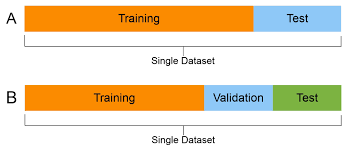

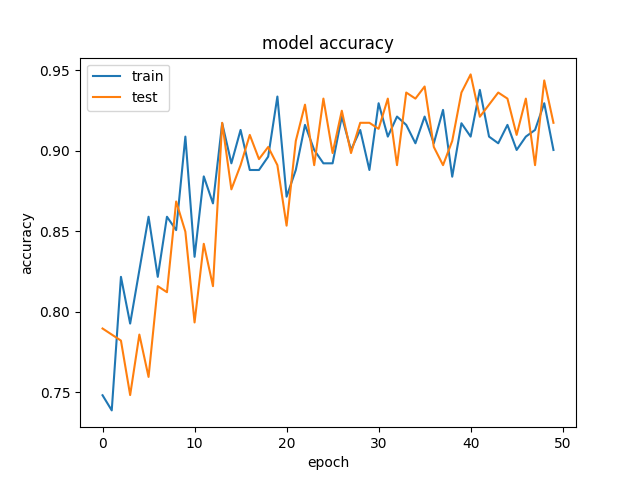

In [100]:
def individual_stock(price_df, vol_df, name):
    stock_df = pd.DataFrame({
        'Date': price_df['Date'],
        'Close': price_df[name],
        'Volume': vol_df[name]
    })
    return stock_df

In [101]:
def trading_window(data):
    n = 1
    data['Target'] = data['Close'].shift(-n)
    return data

In [102]:
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'Nvidia')
price_volume_df

,Date,Close,Volume
1012,2/1/2020,59.98,23770000
1011,3/1/2020,59.02,20580000
1010,6/1/2020,59.27,26290000
1009,7/1/2020,59.98,31920000
1008,8/1/2020,60.09,27720000
...,...,...,...
4,29-01-2024,624.65,33900000
3,30-01-2024,627.74,39600000
2,31-01-2024,615.27,45070000
1,1/2/2024,630.27,36020000


In [103]:

price_volume_target_df = trading_window(price_volume_df)
price_volume_target_df

,Date,Close,Volume,Target
1012,2/1/2020,59.98,23770000,59.02
1011,3/1/2020,59.02,20580000,59.27
1010,6/1/2020,59.27,26290000,59.98
1009,7/1/2020,59.98,31920000,60.09
1008,8/1/2020,60.09,27720000,60.76
...,...,...,...,...
4,29-01-2024,624.65,33900000,627.74
3,30-01-2024,627.74,39600000,615.27
2,31-01-2024,615.27,45070000,630.27
1,1/2/2024,630.27,36020000,661.60


In [104]:
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
1012,2/1/2020,59.98,23770000,59.02
1011,3/1/2020,59.02,20580000,59.27
1010,6/1/2020,59.27,26290000,59.98
1009,7/1/2020,59.98,31920000,60.09
1008,8/1/2020,60.09,27720000,60.76
...,...,...,...,...
5,26-01-2024,610.31,39030000,624.65
4,29-01-2024,624.65,33900000,627.74
3,30-01-2024,627.74,39600000,615.27
2,31-01-2024,615.27,45070000,630.27


In [105]:
from sklearn.preprocessing import MinMaxScaler

def scale_data(df):
    sc = MinMaxScaler(feature_range=(0, 1))
    scaled_array = sc.fit_transform(df.drop(columns=['Date']))
    return scaled_array


In [106]:
price_volume_target_scaled_df  = scale_data(price_volume_target_df)
price_volume_target_scaled_df

array([[0.01872086, 0.09730633, 0.01619592],
       [0.01706902, 0.07510267, 0.01660408],
       [0.01749918, 0.11484652, 0.01776327],
       ...,
       [0.99564671, 0.20748939, 0.92435918],
       [0.97419   , 0.24556275, 0.94884898],
       [1.        , 0.18257117, 1.        ]])

In [107]:
price_volume_target_scaled_df.shape

(1012, 3)

In [108]:
# Creating Feature and Target
X = price_volume_target_scaled_df[:,:2]
y = price_volume_target_scaled_df[:,2:]

In [109]:
# Converting dataframe to arrays
# X = np.asarray(X)
# y = np.asarray(y)
X.shape, y.shape
     

((1012, 2), (1012, 1))

In [110]:
# Spliting the data this way, since order is important in time-series
# Note that we did not use train test split with it's default settings since it shuffles the data
split = int(0.65 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [111]:
X_train.shape, y_train.shape

((657, 2), (657, 1))

In [112]:
X_test.shape, y_test.shape

((355, 2), (355, 1))

In [113]:
import matplotlib.pyplot as plt

def show_plot(data, title):
    plt.figure(figsize=(13, 5))
    plt.plot(data, linewidth=3)
    plt.title(title)
    plt.grid()
    plt.show()

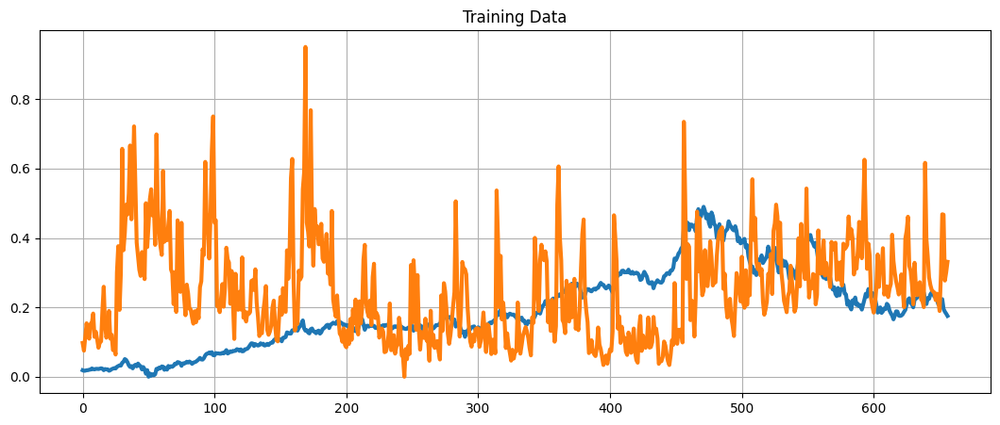

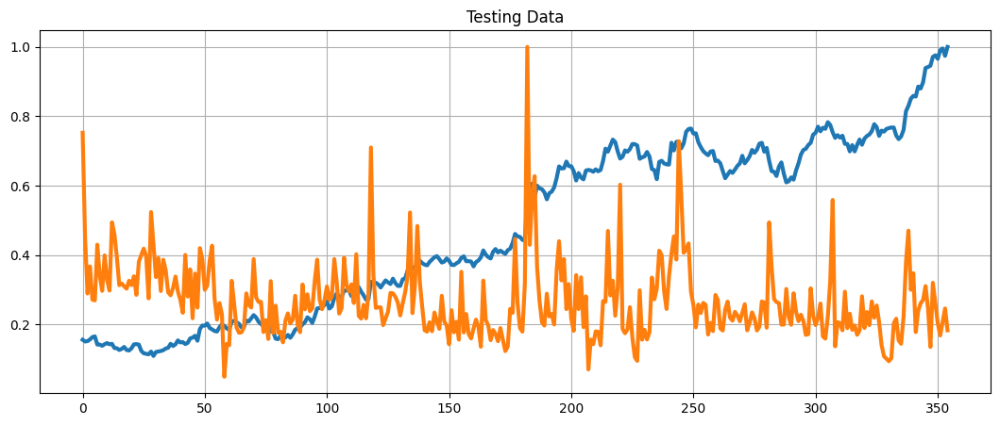

In [114]:
show_plot(X_train, 'Training Data')
show_plot(X_test, 'Testing Data')

# SIMPLE LINEAR REGRESSION

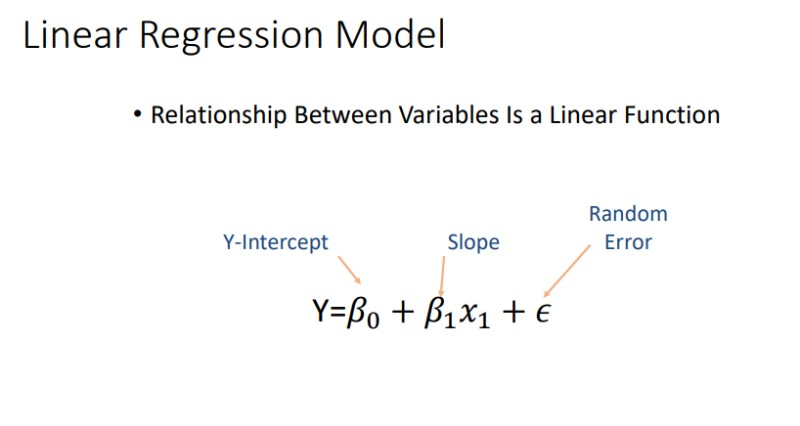

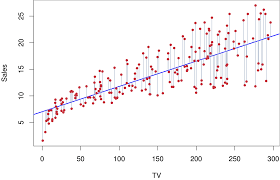

# Ridge Regression and regularization

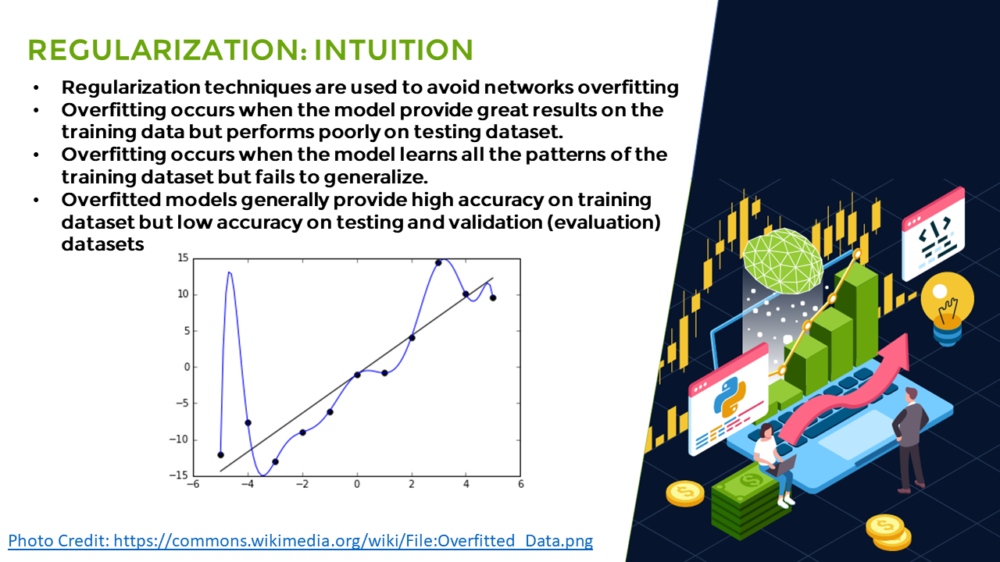

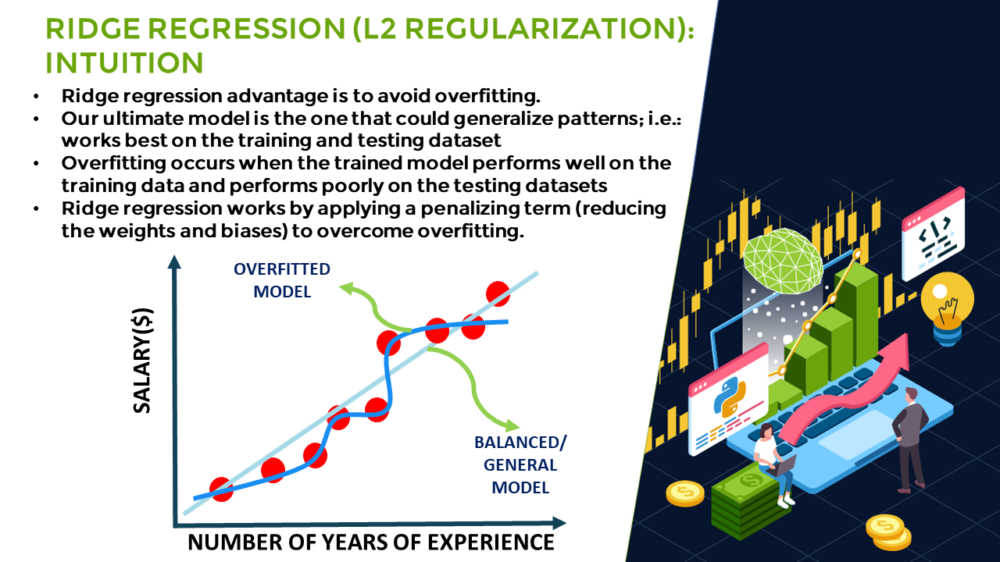

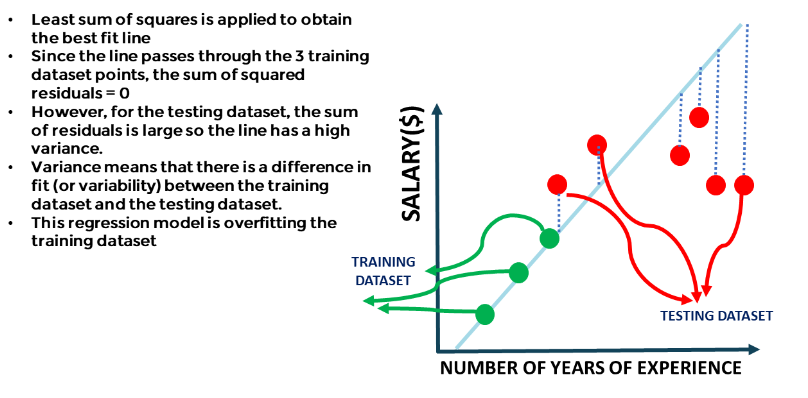

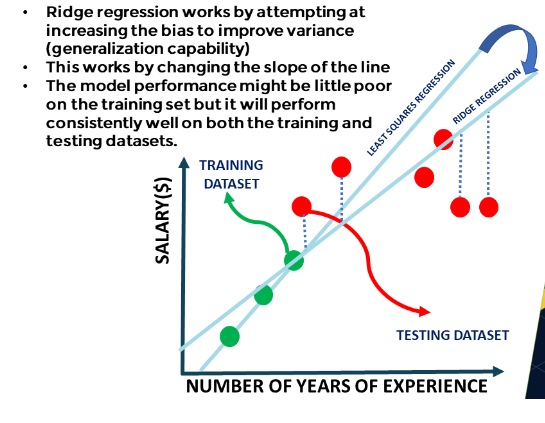
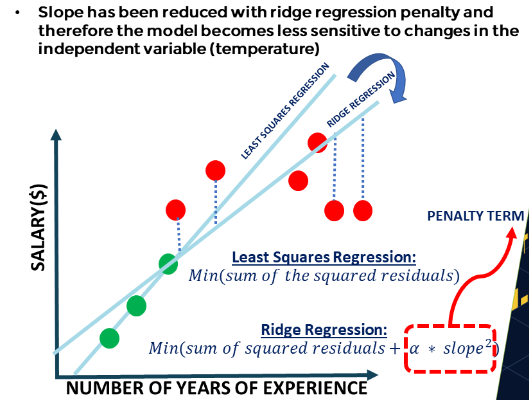
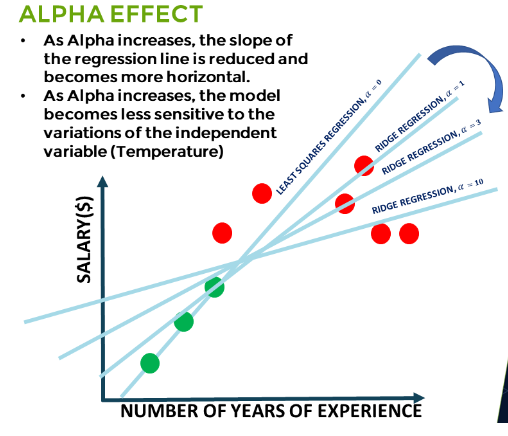

# TRAINING A RIDGE LINEAR REGRESSION MODEL

In [115]:
from sklearn.linear_model import Ridge
# Note that Ridge regression performs linear least squares with L2 regularization.
# Create and train the Ridge Linear Regression  Model
regression_model = Ridge()
regression_model.fit(X_train, y_train)

Ridge()

In [116]:
lr_accuracy = regression_model.score(X_test, y_test)
print("Linear Regression Score: ", lr_accuracy)

Linear Regression Score:  0.965743088271747


In [117]:
predicted_prices = regression_model.predict(X)
predicted_prices

array([[0.03668633],
       [0.03539057],
       [0.03557331],
       ...,
       [0.86233719],
       [0.84401854],
       [0.86613212]])

In [118]:
Predicted = []
for i in predicted_prices:
  Predicted.append(i[0])

In [119]:
len(Predicted)

1012

In [120]:
close = []
for i in price_volume_target_scaled_df:
  close.append(i[0])

In [121]:
df_predicted = price_volume_target_df[['Date']]
df_predicted
     

,Date
1012,2/1/2020
1011,3/1/2020
1010,6/1/2020
1009,7/1/2020
1008,8/1/2020
...,...
5,26-01-2024
4,29-01-2024
3,30-01-2024
2,31-01-2024


In [122]:
df_predicted['Close'] = close
df_predicted

,Date,Close
1012,2/1/2020,0.018721
1011,3/1/2020,0.017069
1010,6/1/2020,0.017499
1009,7/1/2020,0.018721
1008,8/1/2020,0.018910
...,...,...
5,26-01-2024,0.965655
4,29-01-2024,0.990330
3,30-01-2024,0.995647
2,31-01-2024,0.974190


In [123]:
df_predicted['Prediction'] = Predicted
df_predicted
     

,Date,Close,Prediction
1012,2/1/2020,0.018721,0.036686
1011,3/1/2020,0.017069,0.035391
1010,6/1/2020,0.017499,0.035573
1009,7/1/2020,0.018721,0.036428
1008,8/1/2020,0.018910,0.036721
...,...,...,...
5,26-01-2024,0.965655,0.836993
4,29-01-2024,0.990330,0.858022
3,30-01-2024,0.995647,0.862337
2,31-01-2024,0.974190,0.844019


In [124]:
interactive_plot(df_predicted, "Original Vs. Prediction")

# THEORY AND INTUITION BEHIND NEURAL NETWORKS

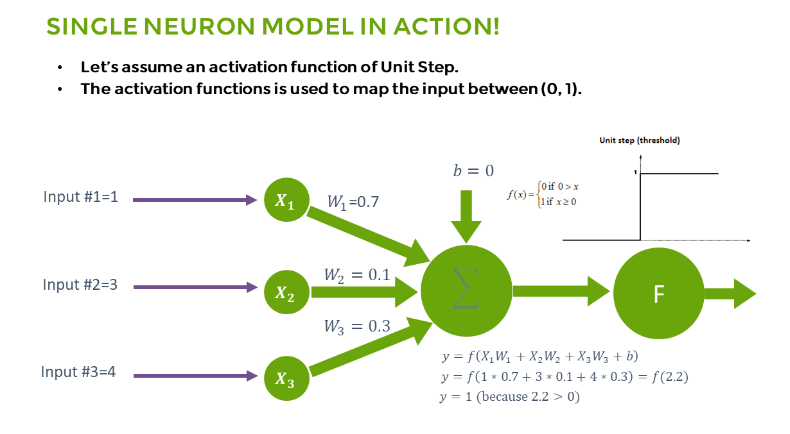
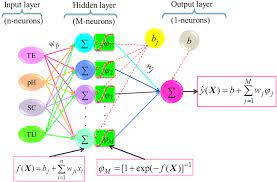

# HOW TO TRAIN AN ANN

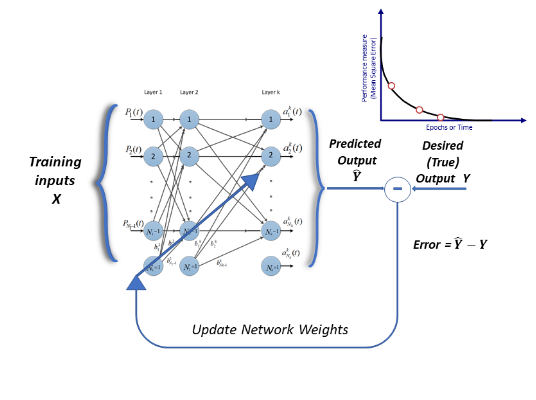
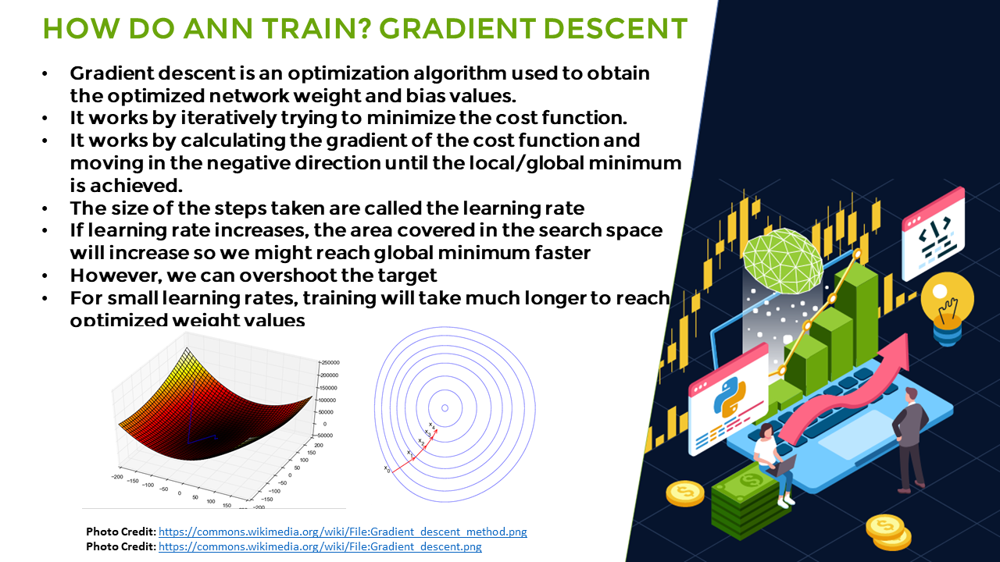
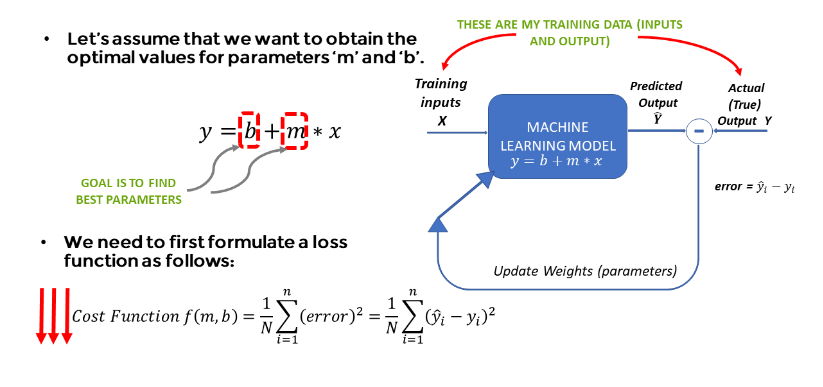
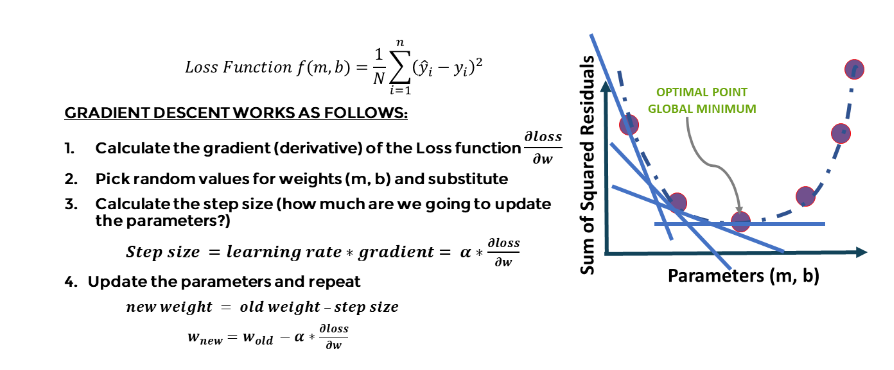

# RECURRENT NEURAL NETWORKS (RNN)

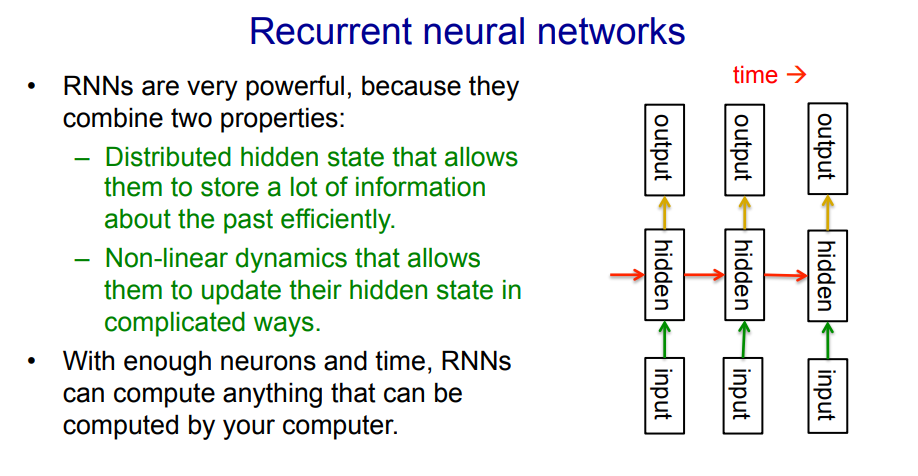
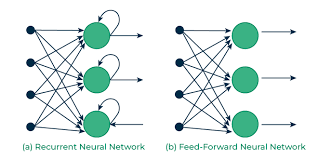

## RNN architecture

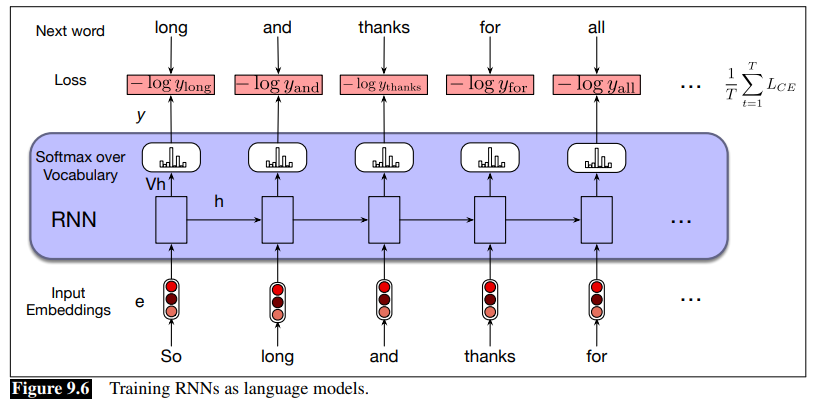

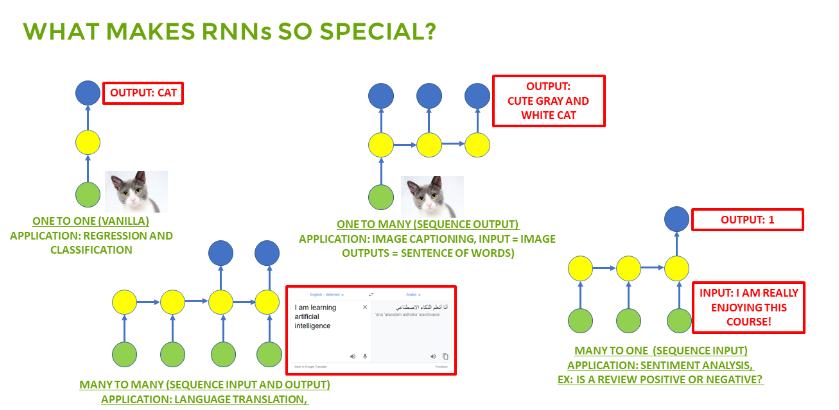
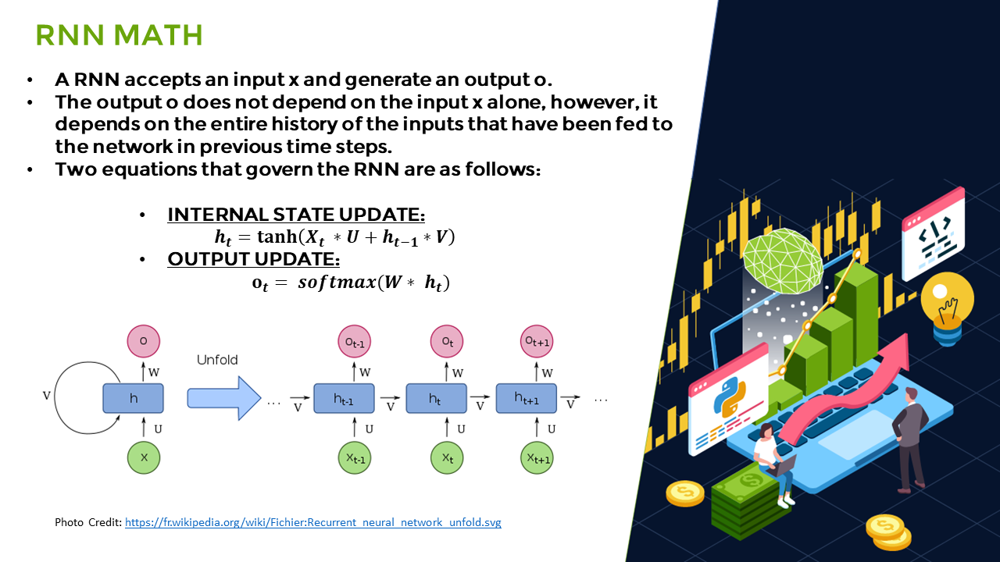

# INTUITION BEHIND LSTM



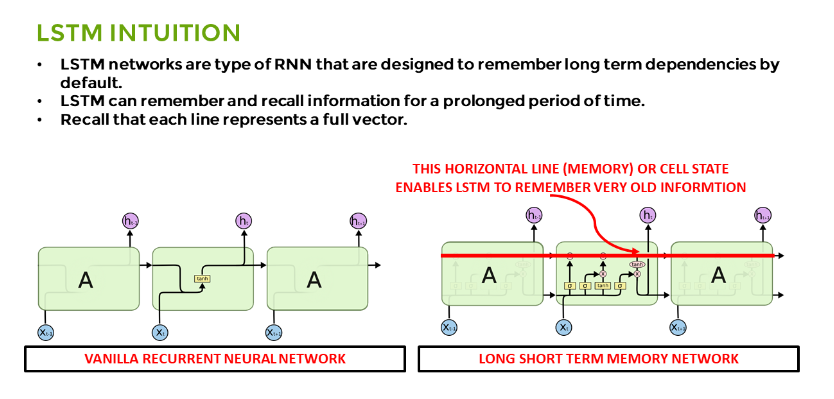
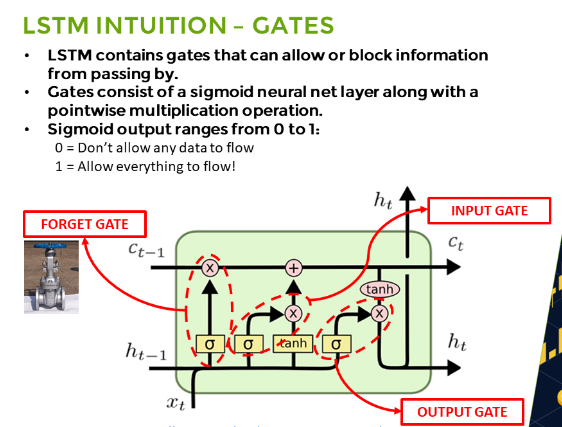

## FORGET GATE

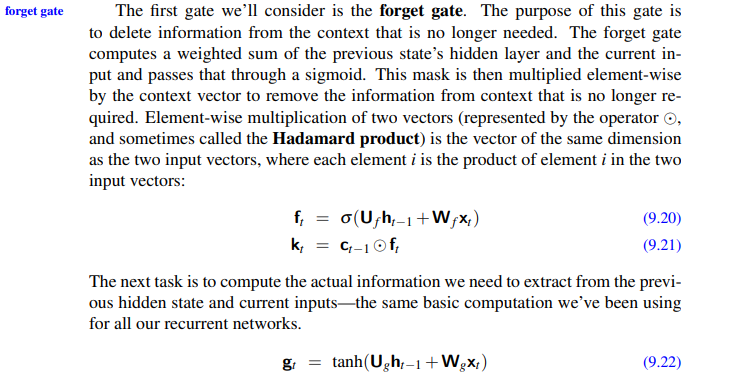

## ADD GATE

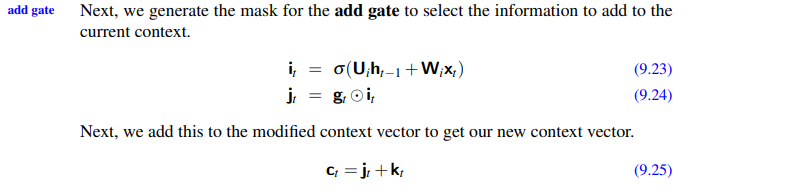

## OUTPUT GATE

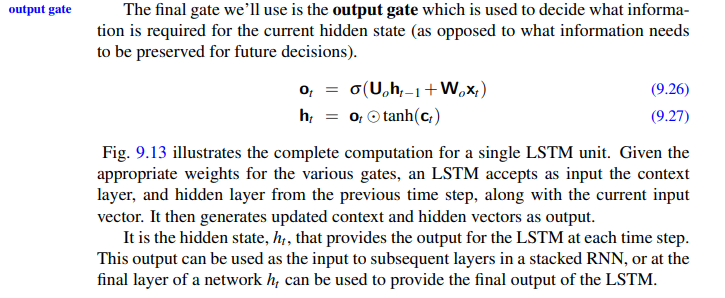

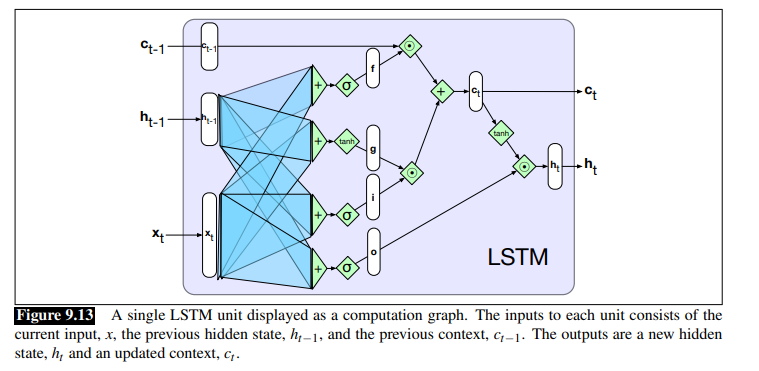

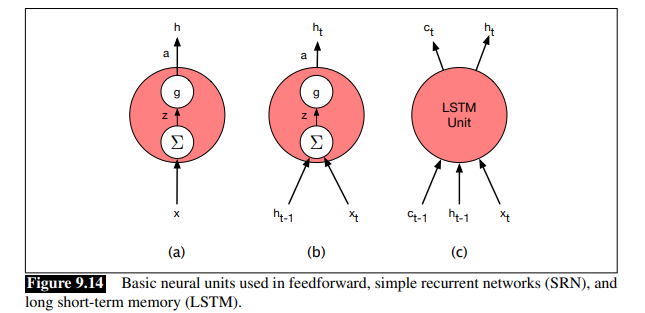




### TRAINING LSTM TIME SERIES MODEL

In [125]:
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'Nasdaq100')
price_volume_df

,Date,Close,Volume
1012,2/1/2020,8872.22,152650000
1011,3/1/2020,8793.90,144750000
1010,6/1/2020,8848.51,142380000
1009,7/1/2020,8846.45,151390000
1008,8/1/2020,8912.37,164570000
...,...,...,...
4,29-01-2024,17596.27,238750000
3,30-01-2024,17476.71,236210000
2,31-01-2024,17137.24,366450000
1,1/2/2024,17344.71,240640000


In [126]:
training_data = price_volume_df.iloc[:, 1:3].values
training_data

array([[8.872220e+03, 1.526500e+08],
       [8.793900e+03, 1.447500e+08],
       [8.848510e+03, 1.423800e+08],
       ...,
       [1.713724e+04, 3.664500e+08],
       [1.734471e+04, 2.406400e+08],
       [1.764273e+04, 3.156200e+08]])

In [127]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

In [128]:
# Create the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])

In [129]:
X = np.asarray(X)
y = np.asarray(y)

In [130]:
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [131]:
# Reshape the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

((708, 1, 1), (304, 1, 1))

In [179]:
# Create the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(350, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(350, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(350)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 1, 1)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 1, 350)              │         492,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 1, 350)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 1, 350)              │         981,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 1, 350)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 350)                 │         981,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             351 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,455,951 (9.37 MB)

 Trainable params: 2,455,951 (9.37 MB)

 Non-trainable params: 0 (0.00 B)

In [180]:
history = model.fit(
    X_train, y_train,
    epochs = 60,
    batch_size = 32,
    validation_split = 0.2
)

Epoch 1/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.2564 - val_loss: 0.0641
Epoch 2/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0404 - val_loss: 0.0021
Epoch 3/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0148 - val_loss: 0.0013
Epoch 4/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0085 - val_loss: 7.3503e-04
Epoch 5/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0024 - val_loss: 7.6137e-04
Epoch 6/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0012 - val_loss: 9.6780e-04
Epoch 7/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0013 - val_loss: 6.4559e-04
Epoch 8/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0012 - val_loss: 6.3877e-04
Epoch 9/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0010 - val_loss: 6.8425e-04
Epoch 10/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0011 - val_loss: 6.3893e-04
Epoch 11/60
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0013 - val_loss: 6.4069e-04
Epoch 12/60
18/18 ━━━━━━━━━━━━━

In [181]:
predicted = model.predict(X)

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


In [182]:
predicted

array([[0.17968194],
       [0.1720194 ],
       [0.17736271],
       ...,
       [0.981121  ],
       [0.9515026 ],
       [0.96962833]], dtype=float32)

In [183]:
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

In [184]:
test_predicted
     

[0.17968194,
 0.1720194,
 0.17736271,
 0.17716119,
 0.18360832,
 0.1911605,
 0.18891367,
 0.19907548,
 0.19543903,
 0.19565883,
 0.20438232,
 0.20913844,
 0.20844556,
 0.21058747,
 0.21335824,
 0.20599002,
 0.1875003,
 0.20105591,
 0.20209874,
 0.20546485,
 0.19134423,
 0.20450236,
 0.22477418,
 0.22803082,
 0.23567113,
 0.2313061,
 0.24257472,
 0.24267396,
 0.2519482,
 0.25024647,
 0.2529575,
 0.25356224,
 0.26220503,
 0.25337067,
 0.23574607,
 0.19995247,
 0.17602731,
 0.17983255,
 0.13701485,
 0.13948311,
 0.18024528,
 0.15249033,
 0.18721682,
 0.16005124,
 0.14620197,
 0.08899635,
 0.13069414,
 0.09471273,
 0.021501472,
 0.0936442,
 -0.002551468,
 0.042269632,
 0.012757646,
 0.023958735,
 -0.0051328503,
 -0.0038831737,
 0.050150868,
 0.041841272,
 0.08398583,
 0.05355902,
 0.08318636,
 0.07575001,
 0.04348752,
 0.058222793,
 0.047614302,
 0.102143176,
 0.098961525,
 0.11667893,
 0.117562145,
 0.12681456,
 0.16205907,
 0.15224238,
 0.16848902,
 0.17578764,
 0.16542277,
 0.13371107,


In [185]:
df_predicted = price_volume_df[1:][['Date']]
df_predicted

,Date
1011,3/1/2020
1010,6/1/2020
1009,7/1/2020
1008,8/1/2020
1007,9/1/2020
...,...
4,29-01-2024
3,30-01-2024
2,31-01-2024
1,1/2/2024


In [186]:
df_predicted['predictions'] = test_predicted

In [187]:
df_predicted
     

,Date,predictions
1011,3/1/2020,0.179682
1010,6/1/2020,0.172019
1009,7/1/2020,0.177363
1008,8/1/2020,0.177161
1007,9/1/2020,0.183608
...,...,...
4,29-01-2024,0.976275
3,30-01-2024,0.991504
2,31-01-2024,0.981121
1,1/2/2024,0.951503


In [188]:
close = []
for i in training_set_scaled:
  close.append(i[0])

In [189]:
df_predicted['Close'] = close[1:]
     

df_predicted

,Date,predictions,Close
1011,3/1/2020,0.179682,0.169002
1010,6/1/2020,0.172019,0.174131
1009,7/1/2020,0.177363,0.173937
1008,8/1/2020,0.177161,0.180128
1007,9/1/2020,0.183608,0.187383
...,...,...,...
4,29-01-2024,0.976275,0.995637
3,30-01-2024,0.991504,0.984409
2,31-01-2024,0.981121,0.952529
1,1/2/2024,0.951503,0.972013


In [190]:
interactive_plot(df_predicted, "Original Vs Prediction")

In [191]:
interactive_plot(stock_vol_df, 'Stocks Volume')
     

In [192]:
interactive_plot(normalize(stock_price_df), 'Stock Prices')

interactive_plot(normalize(stock_vol_df), 'Normalized Volume')
     


In [193]:
df_predicted

,Date,predictions,Close
1011,3/1/2020,0.179682,0.169002
1010,6/1/2020,0.172019,0.174131
1009,7/1/2020,0.177363,0.173937
1008,8/1/2020,0.177161,0.180128
1007,9/1/2020,0.183608,0.187383
...,...,...,...
4,29-01-2024,0.976275,0.995637
3,30-01-2024,0.991504,0.984409
2,31-01-2024,0.981121,0.952529
1,1/2/2024,0.951503,0.972013


In [194]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score, r2_score

In [195]:
y_true = df_predicted['Close']
y_pred = df_predicted['predictions']

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_true, y_pred)
print(f"Mean Absolute Error (MAE): {mae:.4f}")

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_true, y_pred)
print(f"Mean Squared Error (MSE): {mse:.4f}")

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Calculate Explained Variance Score (EVS)
evs = explained_variance_score(y_true, y_pred)
print(f"Explained Variance Score (EVS): {evs:.4f}")

# Calculate R² Score
r2 = r2_score(y_true, y_pred)
print(f"R² Score: {r2:.4f}")


Mean Absolute Error (MAE): 0.0157
Mean Squared Error (MSE): 0.0004
Root Mean Squared Error (RMSE): 0.0209
Explained Variance Score (EVS): 0.9915
R² Score: 0.9901


In [197]:
interactive_plot(df_predicted, "Original Vs Prediction")

In [201]:
!pip install nbconvert[webpdf]

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/29.7 MB ? eta -:--:--
   ------ --------------------------------- 5.0/29.7 MB 23.1 MB/s eta 0:00:02
   ---------- ----------------------------- 8.1/29.7 MB 19.3 MB/s eta 0:00:02
   ----------------- ---------------------- 13.1/29.7 MB 20.6 MB/s eta 0:00:01
   -------------------------- ------------- 19.4/29.7 MB 23.1 MB/s eta 0:00:01
   ---------------------------- ----------- 21.5/29.7 MB 23.8 MB/s eta 0:00:01
   ---------------------------------------  29.4/29.7 MB 23.3 MB/s eta 0:00:01
   ---------------------------------------  29.6/29.7 MB 23.2 MB/s eta 0:00:01
   ---------------------------------------  29.6/29.7 MB 23.2 MB/s eta 0:00:01
   ---------------------------------------  29.6/29.7 MB 23.2 MB/s eta 0:00:01
   ---------------------------------------  29.6/29.7 MB 23.2 MB/s eta 0:00:01
   ---------------------------------------  29.6/29.7 MB 23.2 MB

In [202]:
!pip install --upgrade nbconvert jinja2

Defaulting to user installation because normal site-packages is not writeable


In [203]:
!pip show nbconvert jinja2

Name: nbconvert
Version: 7.16.4
Summary: Converting Jupyter Notebooks (.ipynb files) to other formats.  Output formats include asciidoc, html, latex, markdown, pdf, py, rst, script.  nbconvert can be used both as a Python library (`import nbconvert`) or as a command line tool (invoked as `jupyter nbconvert ...`).
Home-page: https://jupyter.org
Author: 
Author-email: Jupyter Development Team <jupyter@googlegroups.com>
License: BSD 3-Clause License

- Copyright (c) 2001-2015, IPython Development Team
- Copyright (c) 2015-, Jupyter Development Team

All rights reserved.

Redistribution and use in source and binary forms, with or without
modification, are permitted provided that the following conditions are met:

1. Redistributions of source code must retain the above copyright notice, this
   list of conditions and the following disclaimer.

2. Redistributions in binary form must reproduce the above copyright notice,
   this list of conditions and the following disclaimer in the documenta

In [204]:
!pip install nbconvert==6.5.0


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/561.6 kB ? eta -:--:--
   ------------------------------------- -- 524.3/561.6 kB 5.6 MB/s eta 0:00:01
   ------------------------------------- -- 524.3/561.6 kB 5.6 MB/s eta 0:00:01
   ---------------------------------------- 561.6/561.6 kB 1.0 MB/s eta 0:00:00
  Attempting uninstall: mistune
    Found existing installation: mistune 3.0.2
    Uninstalling mistune-3.0.2:
      Successfully uninstalled mistune-3.0.2
  Attempting uninstall: nbconvert
    Found existing installation: nbconvert 7.16.4
    Uninstalling nbconvert-7.16.4:
      Successfully uninstalled nbconvert-7.16.4
